<a href="https://colab.research.google.com/github/yashjain5/Transfer-Learning/blob/main/model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


### **Cloning the TensorFlow Model Garden**



In [2]:
%cd '/content/gdrive/My Drive/transfer_learning_project'
!git clone https://github.com/tensorflow/models.git

%cd '/content/gdrive/MyDrive/transfer_learning_project/models'
!git checkout -f e04dafd04d69053d3733bb91d47d0d95bc2c8199

/content/gdrive/My Drive/transfer_learning_project
Cloning into 'models'...
remote: Enumerating objects: 57544, done.
remote: Counting objects: 100% (1607/1607), done.
remote: Compressing objects: 100% (539/539), done.
remote: Total 57544 (delta 1106), reused 1506 (delta 1052), pack-reused 55937
Receiving objects: 100% (57544/57544), 573.00 MiB | 18.74 MiB/s, done.
Resolving deltas: 100% (39769/39769), done.
Checking out files: 100% (2470/2470), done.
/content/gdrive/MyDrive/transfer_learning_project/models
Checking out files: 100% (1359/1359), done.
Note: checking out 'e04dafd04d69053d3733bb91d47d0d95bc2c8199'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkou

### **Installing the Object Detection API**

In [3]:
%cd '/content/gdrive/MyDrive/transfer_learning_project/models/research/'

/content/gdrive/MyDrive/transfer_learning_project/models/research


In [4]:
!protoc object_detection/protos/*.proto --python_out=.

In [5]:
cp object_detection/packages/tf2/setup.py .

In [6]:
!python -m pip install .

Processing /content/gdrive/My Drive/transfer_learning_project/models/research
     |████████████████████████████████| 9.6MB 10.0MB/s 
     |████████████████████████████████| 358kB 43.5MB/s 
     |████████████████████████████████| 1.6MB 49.3MB/s 
     |████████████████████████████████| 829kB 50.0MB/s 
     |████████████████████████████████| 2.3MB 39.5MB/s 
     |████████████████████████████████| 153kB 38.3MB/s 
     |████████████████████████████████| 61kB 8.7MB/s 
     |████████████████████████████████| 1.2MB 49.8MB/s 
     |████████████████████████████████| 51kB 8.0MB/s 
     |████████████████████████████████| 645kB 45.4MB/s 
     |████████████████████████████████| 102kB 11.5MB/s 
     |████████████████████████████████| 61kB 8.8MB/s 
     |████████████████████████████████| 174kB 57.4MB/s 
     |████████████████████████████████| 686kB 44.1MB/s 
     |████████████████████████████████| 38.2MB 82kB/s 
  Created wheel for object-detection: filename=object_detection-0.1-cp37-none-any.whl siz

### **Imports**

In [7]:
import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt

from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

### **Defining utility functions**

In [8]:
# To load an image from a file into a numpy array
def load_image_into_numpy_array(path):
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

# To visualize the detections
def plot_detections(image_np, boxes, classes, scores, category_index, figsize=(12, 16), image_name = None):
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates = True,
      min_score_thresh = 0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

### **Collecting the images of rubber ducks from the TensorFlow Model Garden**

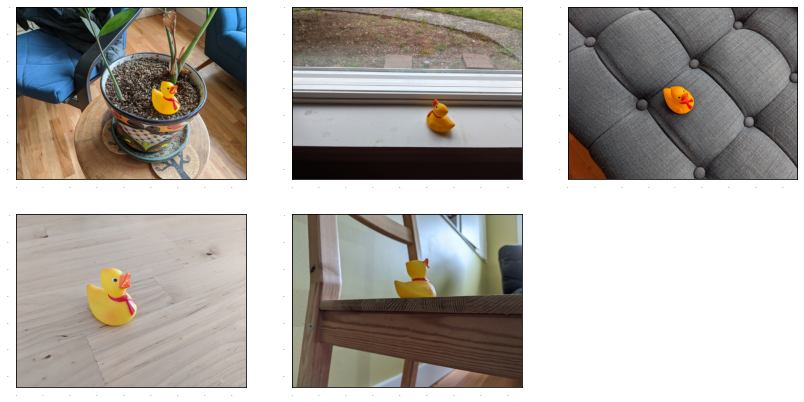

In [9]:
train_image_dir = '/content/gdrive/MyDrive/transfer_learning_project/models/research/object_detection/test_images/ducky/train/'
train_images_np = []

for i in range(1, 6):
  image_path = os.path.join(train_image_dir, 'robertducky' + str(i) + '.jpg')
  train_images_np.append(load_image_into_numpy_array(image_path))

plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [14, 7]

for idx, train_image_np in enumerate(train_images_np):
  plt.subplot(2, 3, idx+1)
  plt.imshow(train_image_np)
plt.show()

### **Manually annotating the images with bounding boxes**

In [10]:
gt_boxes = []
colab_utils.annotate(train_images_np, box_storage_pointer = gt_boxes)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'--boxes array populated--'

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'--boxes array populated--'

<IPython.core.display.Javascript object>

### **Preparing the training data**

In [11]:
duck_class_id = 1
num_classes = 1
category_index = {duck_class_id: {'id': duck_class_id, 'name': 'rubber_duck'}}
label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []

for (train_image_np, gt_box_np) in zip(train_images_np, gt_boxes):
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(train_image_np, dtype = tf.float32), axis = 0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype = tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(np.ones(shape = [gt_box_np.shape[0]], dtype = np.int32) - label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(zero_indexed_groundtruth_classes, num_classes))

print('Annotating and labelling done')

Annotating and labelling done


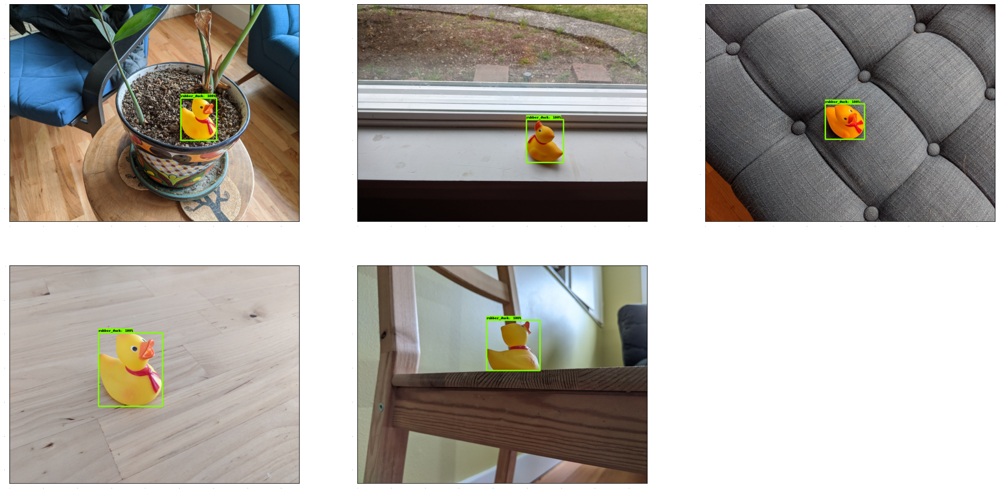

In [12]:
dummy_scores = np.array([1.0], dtype = np.float32)  # give boxes a score of 100%
plt.figure(figsize = (30, 15))

for idx in range(5):
  plt.subplot(2, 3, idx+1)
  plot_detections(
      train_images_np[idx],
      gt_boxes[idx],
      np.ones(shape = [gt_boxes[idx].shape[0]], dtype = np.int32),
      dummy_scores, category_index)
  
plt.show()

### **Downloading the SSD ResNet50 checkpoint**

In [13]:
pwd

'/content/gdrive/My Drive/transfer_learning_project/models/research'

In [14]:
%cd '/content/gdrive/MyDrive/transfer_learning_project/models/research/object_detection/'

/content/gdrive/MyDrive/transfer_learning_project/models/research/object_detection


In [15]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz

# Moving the checkpoint into transfer_learning_project/models/research/object_detection/test_data
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint /content/gdrive/MyDrive/transfer_learning_project/models/research/object_detection/test_data/

--2021-05-29 13:39:49--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.142.128, 2607:f8b0:400e:c08::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.142.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M  73.7MB/s    in 3.2s    

2021-05-29 13:39:53 (73.7 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [244817203/244817203]



### **Restoring all but the classification layer at the top**

In [16]:
tf.keras.backend.clear_session()
print('Building model and restoring weights for fine-tuning...', flush = True)

num_classes = 1
pipeline_config = '/content/gdrive/MyDrive/transfer_learning_project/models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = '/content/gdrive/MyDrive/transfer_learning_project/models/research/object_detection/test_data/checkpoint/ckpt-0'

configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training = True)

fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor = fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# Running model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)

print('Weights restored')

Building model and restoring weights for fine-tuning...
Weights restored


### **Fine-tuning the pre-trained model on the rubber duck images**

In [17]:
tf.keras.backend.set_learning_phase(True)
batch_size = 4
learning_rate = 0.01
num_batches = 100

# Selecting variables in top layers to fine-tune.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

# Setting up forward + backward pass for a single train step.
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
  @tf.function
  def train_step_fn(image_tensors, groundtruth_boxes_list, groundtruth_classes_list):
    shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss
  return train_step_fn

optimizer = tf.keras.optimizers.SGD(learning_rate = learning_rate, momentum = 0.9)
train_step_fn = get_model_train_step_function(
    detection_model, optimizer, to_fine_tune)

print('Start fine-tuning', flush = True)
for idx in range(num_batches):
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]
  gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_image_tensors[key] for key in example_keys]

  # Training step (forward pass + backwards pass)
  total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

  if idx % 10 == 0:
    print('batch ' + str(idx) + ' of ' + str(num_batches)
    + ', loss=' +  str(total_loss.numpy()), flush = True)

print('Fine-tuning done')

Start fine-tuning


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


batch 0 of 100, loss=1.1191335
batch 10 of 100, loss=0.079047315
batch 20 of 100, loss=0.022413153
batch 30 of 100, loss=0.01200591
batch 40 of 100, loss=0.007406513
batch 50 of 100, loss=0.005920547
batch 60 of 100, loss=0.005041564
batch 70 of 100, loss=0.0044776243
batch 80 of 100, loss=0.004090084
batch 90 of 100, loss=0.0037747829
Fine-tuning done


### **Running inference using the fine-tuned model on the test images**

In [18]:
%cd '/content/gdrive/MyDrive/transfer_learning_project/results/'

/content/gdrive/MyDrive/transfer_learning_project/results


In [19]:
test_image_dir = '/content/gdrive/MyDrive/transfer_learning_project/models/research/object_detection/test_images/ducky/test/'
test_images_np = []

for i in range(1, 50):
  image_path = os.path.join(test_image_dir, 'out' + str(i) + '.jpg')
  test_images_np.append(np.expand_dims(load_image_into_numpy_array(image_path), axis = 0))

@tf.function
def detect(input_tensor):
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

label_id_offset = 1
for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype = tf.float32)
  detections = detect(input_tensor)

  plot_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize = (15, 20), image_name = "rubber_duck_frame_" + ('%02d' % i) + ".jpg")


Imageio: 'libfreeimage-3.16.0-linux64.so' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/freeimage/libfreeimage-3.16.0-linux64.so (4.6 MB)
Downloading: 8192/4830080 bytes (0.2%)1097728/4830080 bytes (22.7%)3096576/4830080 bytes (64.1%)4830080/4830080 bytes (100.0%)
  Done
File saved as /root/.imageio/freeimage/libfreeimage-3.16.0-linux64.so.


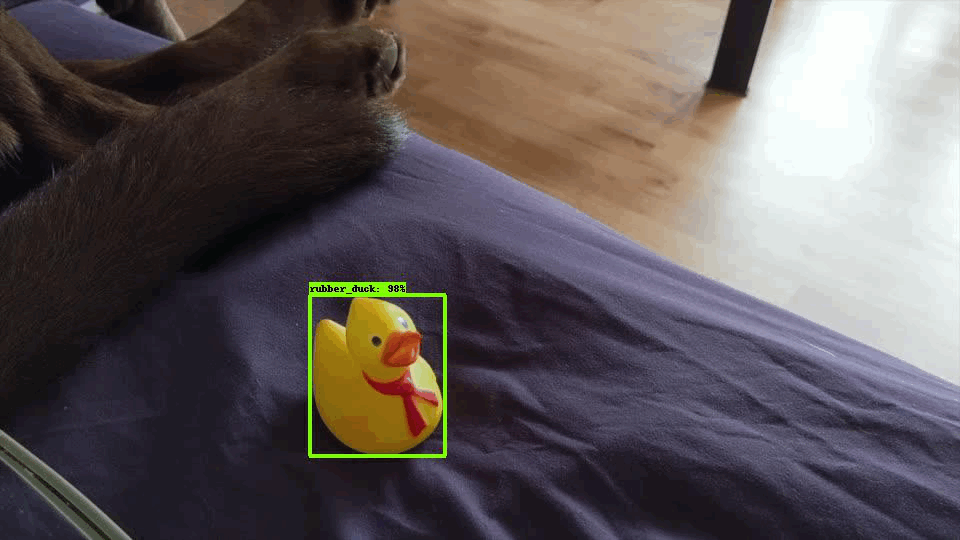

In [20]:
imageio.plugins.freeimage.download()
anim_file = 'rubber_duck_detection.gif'
filenames = glob.glob('rubber_duck_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []

for filename in filenames:
  image = imageio.imread(filename)
  images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=5)
display(IPyImage(open(anim_file, 'rb').read()))